# Clone respository 

In [ ]:
!git clone "https://github.com/RuslanZaripov/rhtr.git"
%cd /kaggle/working/rhtr

# Move to the root folder - rhtr

# Downloading data

In [1]:
!ls -la /kaggle/working

total 12
drwxr-xr-x 3 root root 4096 May 16 12:43 .
drwxr-xr-x 5 root root 4096 May 16 12:43 ..
drwxr-xr-x 2 root root 4096 May 16 12:43 .virtual_documents


In [2]:
!pip install gdown > /dev/null

In [3]:
!gdown 1FlAFoy2VywFPzEtCl9AwM-5Z1Yt3-vUV

Downloading...
From (original): https://drive.google.com/uc?id=1FlAFoy2VywFPzEtCl9AwM-5Z1Yt3-vUV
From (redirected): https://drive.google.com/uc?id=1FlAFoy2VywFPzEtCl9AwM-5Z1Yt3-vUV&confirm=t&uuid=f7c15c63-667a-455c-92e1-d3159515f19f
To: /kaggle/working/SchoolSegmentationDatasetEN-watershed.zip
100%|████████████████████████████████████████| 138M/138M [00:03<00:00, 42.0MB/s]


In [4]:
!gdown 1w31OfxFS8AAm_1rxG8Pz0qy0m8WQWzHN

Downloading...
From (original): https://drive.google.com/uc?id=1w31OfxFS8AAm_1rxG8Pz0qy0m8WQWzHN
From (redirected): https://drive.google.com/uc?id=1w31OfxFS8AAm_1rxG8Pz0qy0m8WQWzHN&confirm=t&uuid=3418bcb4-f56f-4d0b-a157-1ed65a7c981d
To: /kaggle/working/SchoolSegmentationDatasetRU-watershed.zip
100%|██████████████████████████████████████| 2.01G/2.01G [00:29<00:00, 68.8MB/s]


In [5]:
!unzip -o /kaggle/working/SchoolSegmentationDatasetRU-watershed.zip -d '/' > /dev/null

In [6]:
!unzip -o /kaggle/working/SchoolSegmentationDatasetEN-watershed.zip -d '/' > /dev/null

In [7]:
!rm -rf /kaggle/working/SchoolSegmentationDatasetRU-watershed.zip

In [8]:
!rm -rf /kaggle/working/SchoolSegmentationDatasetEN-watershed.zip

# Download Dataset

In [9]:
!rm -rf /kaggle/working/school_notebooks_EN
!git lfs install
!git clone https://huggingface.co/datasets/ai-forever/school_notebooks_EN /kaggle/working/school_notebooks_EN

Error: Failed to call git rev-parse --git-dir: exit status 128 
Git LFS initialized.
Cloning into '/kaggle/working/school_notebooks_EN'...
remote: Enumerating objects: 34, done.
remote: Total 34 (delta 0), reused 0 (delta 0), pack-reused 34 (from 1)
Unpacking objects: 100% (34/34), 3.98 MiB | 6.84 MiB/s, done.


In [10]:
!rm -rf /kaggle/working/school_notebooks_RU
!git lfs install
!git clone https://huggingface.co/datasets/ai-forever/school_notebooks_RU /kaggle/working/school_notebooks_RU

Error: Failed to call git rev-parse --git-dir: exit status 128 
Git LFS initialized.
Cloning into '/kaggle/working/school_notebooks_RU'...
remote: Enumerating objects: 38, done.
remote: Total 38 (delta 0), reused 0 (delta 0), pack-reused 38 (from 1)
Unpacking objects: 100% (38/38), 5.70 KiB | 583.00 KiB/s, done.
Filtering content: 100% (5/5), 2.84 GiB | 121.16 MiB/s, done.


In [11]:
!unzip -o -q '/kaggle/working/school_notebooks_EN/images.zip' -d '/kaggle/working/school_notebooks_EN' > /dev/null

In [12]:
!unzip -o -q '/kaggle/working/school_notebooks_RU/images.zip' -d '/kaggle/working/school_notebooks_RU' > /dev/null

In [13]:
!rm -rf '/kaggle/working/school_notebooks_EN/images.zip'

In [14]:
!rm -rf '/kaggle/working/school_notebooks_RU/images.zip'

# Creating Datasets

In [15]:
import os

os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ['TORCH_USE_CUDA_DSA'] = "1"

In [16]:
# basic random seed
import os
import random
import numpy as np
import torch

DEFAULT_RANDOM_SEED = 2021


def seedBasic(seed=DEFAULT_RANDOM_SEED):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)


# torch random seed
def seedTorch(seed=DEFAULT_RANDOM_SEED):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# basic + torch 
def seedEverything(seed=DEFAULT_RANDOM_SEED):
    seedBasic(seed)
    seedTorch(seed)


def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2 ** 32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

In [17]:
def my_seed(my_seed=42):
    seedEverything(my_seed)
    global g
    g = torch.Generator()
    g.manual_seed(my_seed)

In [18]:
my_seed(42)

In [19]:
!pip install pyclipper > /dev/null

In [20]:
!pip install Cython > /dev/null

In [21]:
import os
import cv2
import pandas as pd
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

import json
import numpy as np
from PIL import Image

from torch.utils.data import Dataset
import torch

import pyclipper
from shapely.geometry import Polygon

from scipy import ndimage

from datetime import datetime

In [24]:
from src.segmentation.preprocessing import *


def preprocessing(input_image):
    #     gray = grayscale(input_image)
    #     cl = clahe1channel(gray)
    #     g = gaussian(cl)
    b = bilateral(input_image)
    return b

In [ ]:
import albumentations as A

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

validation_transform = A.Compose([
    #     A.CLAHE(p=1),
    A.Normalize(),
    A.Resize(width=768, height=768),
])

train_transform = A.Compose([
    #     A.CLAHE(p=1),
    A.Normalize(),
    A.Resize(width=768, height=768),
])

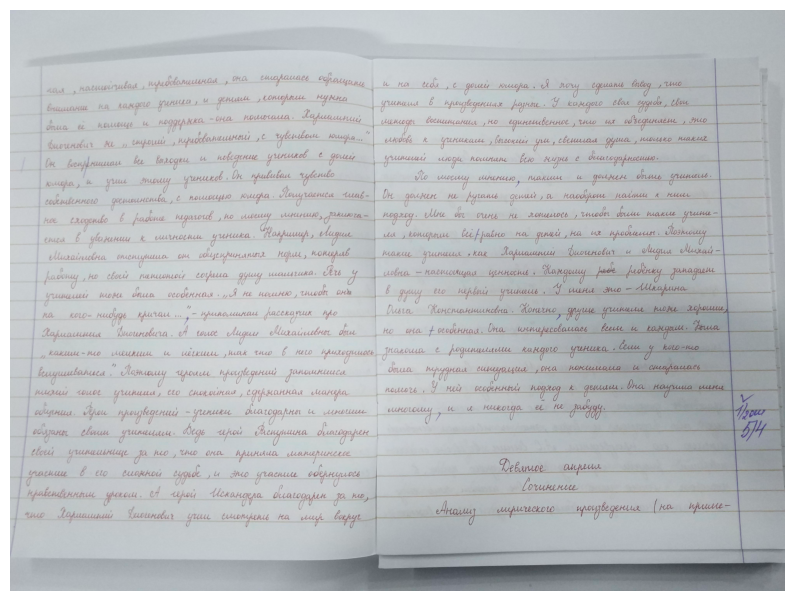

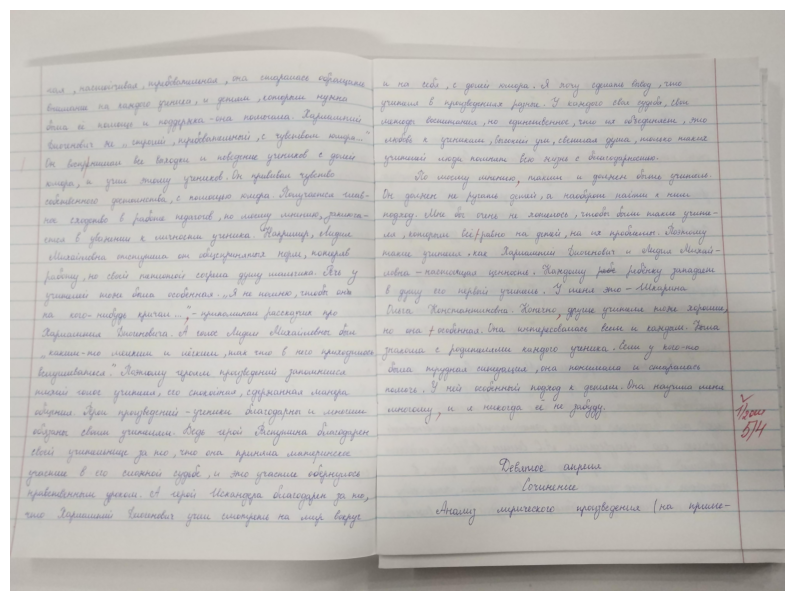

In [25]:
from src.segmentation.utils import visualize

image = cv2.imread('/kaggle/working/school_notebooks_RU/images/2914.jpg')
visualize(image)
visualize(preprocessing(image))

In [26]:
from src.segmentation.dataset import SchoolSegmentationDataset

training_set_ru = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_RU/annotations_train.json',
    '/kaggle/working/school_notebooks_RU/images',
    folder_name='SchoolSegmentationDatasetRU',
    preprocessing=preprocessing,
    transform=train_transform,

    # df_path='/kaggle/working/SchoolSegmentationDatasetRU/annotations_train/df_annotations_train.csv', 
    df_path=None,

    keep=True)

validation_set_ru = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_RU/annotations_val.json',
    '/kaggle/working/school_notebooks_RU/images',
    folder_name='SchoolSegmentationDatasetRU',
    preprocessing=preprocessing,
    transform=validation_transform,

    # df_path='/kaggle/working/SchoolSegmentationDatasetRU/annotations_val/df_annotations_val.csv', 
    df_path=None,

    keep=True)

In [27]:
training_set_en = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_EN/annotations_train.json',
    '/kaggle/working/school_notebooks_EN/images',
    folder_name='SchoolSegmentationDatasetEN',
    preprocessing=preprocessing,
    transform=train_transform,

    # df_path='/kaggle/working/SchoolSegmentationDatasetEN/annotations_train/df_annotations_train.csv', 
    df_path=None,

    keep=True)

validation_set_en = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_EN/annotations_val.json',
    '/kaggle/working/school_notebooks_EN/images',
    folder_name='SchoolSegmentationDatasetEN',
    preprocessing=preprocessing,
    transform=validation_transform,

    # df_path='/kaggle/working/SchoolSegmentationDatasetEN/annotations_val/df_annotations_val.csv', 
    df_path=None,

    keep=True)

In [28]:
seed()

In [29]:
from torch.utils.data import ConcatDataset, Subset

training_set = ConcatDataset([training_set_ru, training_set_en])
training_subset_size = len(training_set) // 4
training_subset_indices = torch.randperm(len(training_set))[:training_subset_size]
training_set = Subset(training_set, training_subset_indices)
training_subset_indices[:10]

tensor([1491,  930, 1503,  169, 1075,  202, 1394, 1191,  572,  460])

In [30]:
validation_set = ConcatDataset([validation_set_ru, validation_set_en])
validation_subset_size = len(validation_set) // 2
validation_subset_indices = torch.randperm(len(validation_set))[:validation_subset_size]
validation_set = Subset(validation_set, validation_subset_indices)
validation_subset_indices[:10]

tensor([ 24,  95,  60, 110,  54,   4, 143, 148, 100, 113])

In [32]:
from src.segmentation.dataset import dynamic_length_collate
import torch
import torchvision

# Create data loaders for our datasets; shuffle for training, not for validation
training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=4,
    # when train set False
    shuffle=True,  # True 
    collate_fn=dynamic_length_collate,
    worker_init_fn=seed_worker,
    generator=g)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=4,
    shuffle=False,
    collate_fn=dynamic_length_collate,
    worker_init_fn=seed_worker,
    generator=g)

# Report split sizes
print('Training set has {} instances'.format(len(training_loader)))
print('Validation set has {} instances'.format(len(validation_loader)))

Training set has 102 instances
Validation set has 20 instances


In [34]:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

 45%|████▌     | 9/20 [00:08<00:10,  1.08it/s]

data[1].keys()=dict_keys(['binary', 'lines', 'border_mask', 'watershed', 'word_polygons', 'line_polygons'])
background_ratio(binary)=0.6475338406032987
background_ratio(lines)=0.9781324598524306



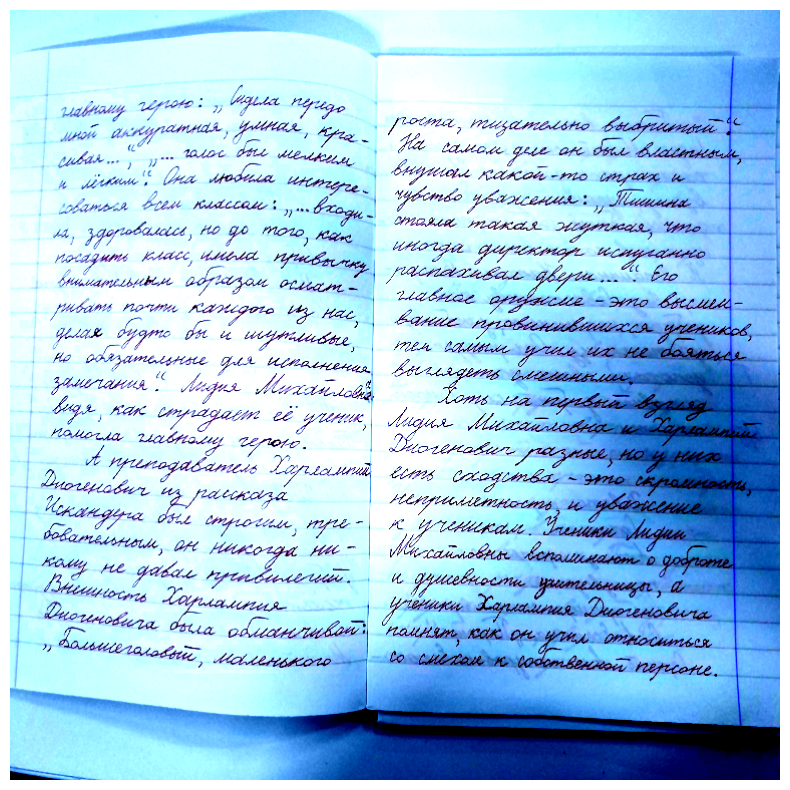

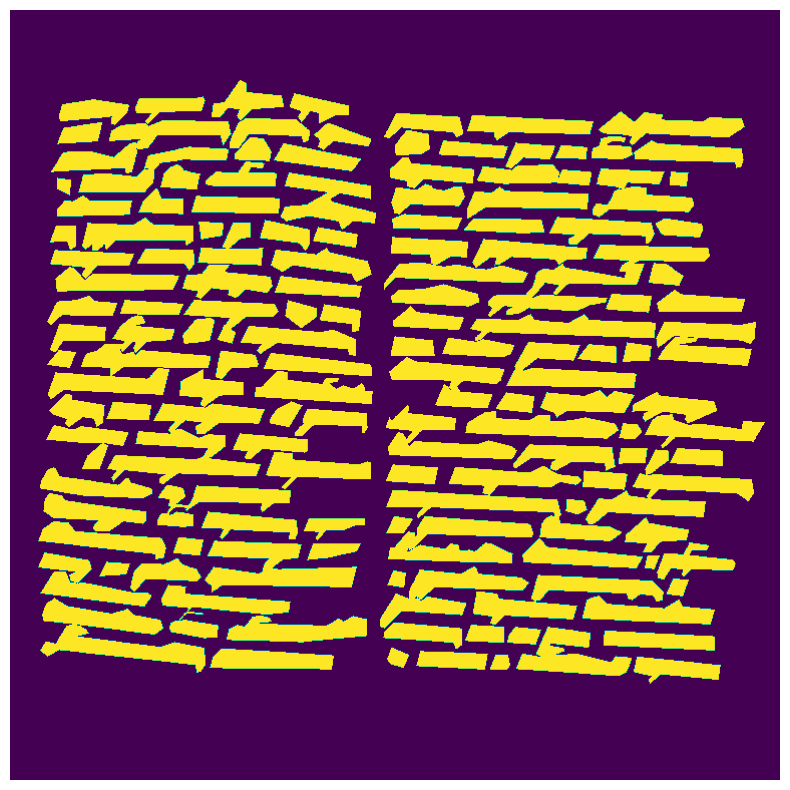

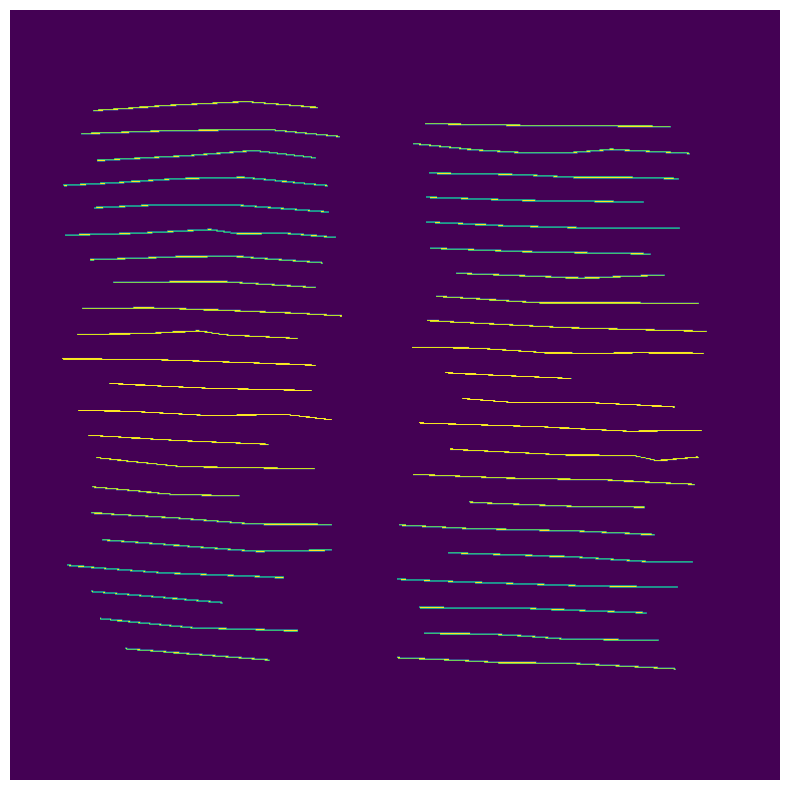

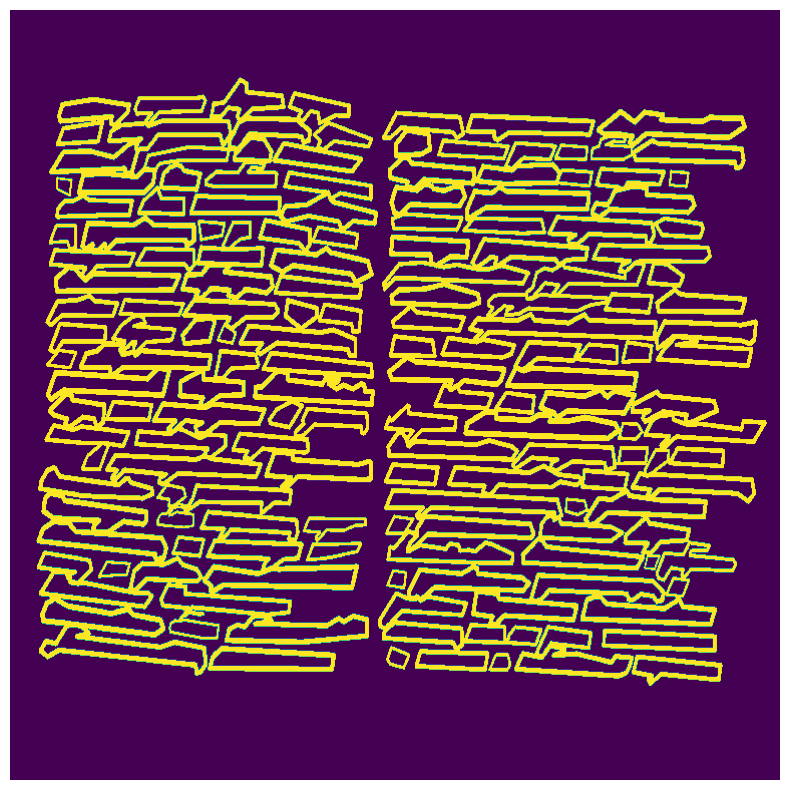

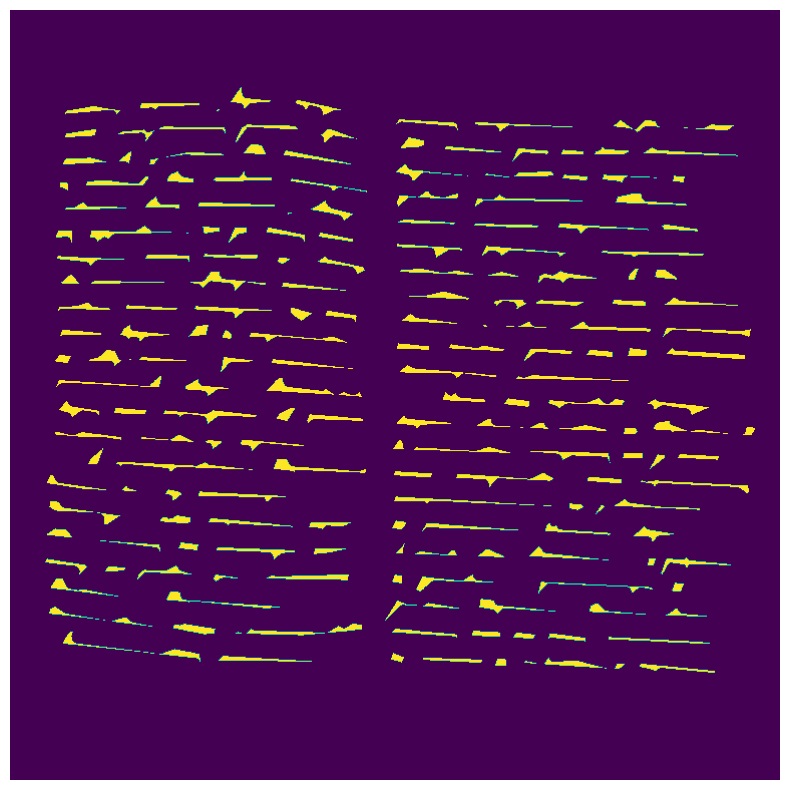

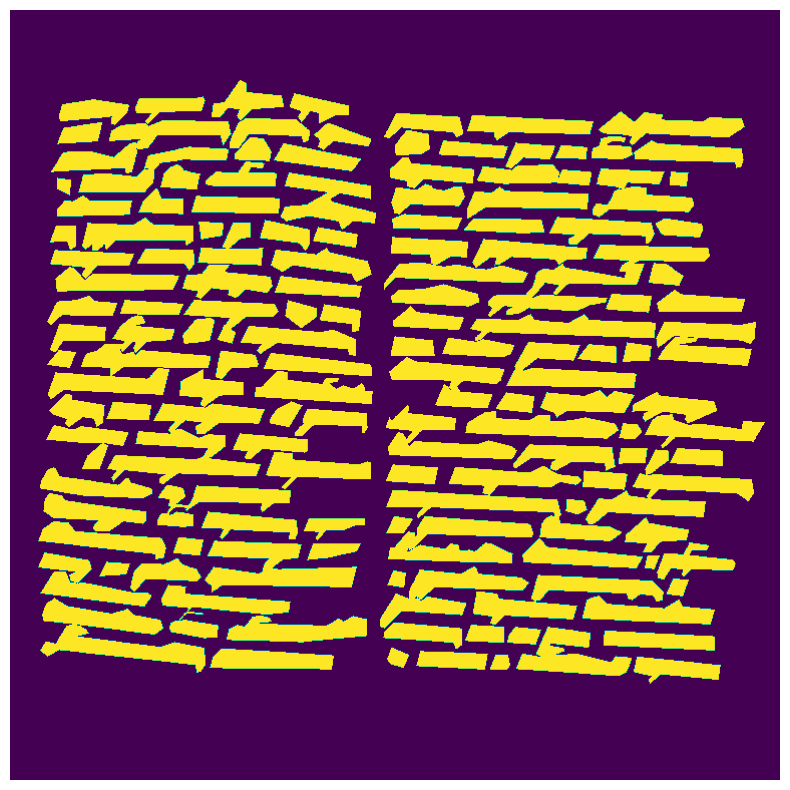

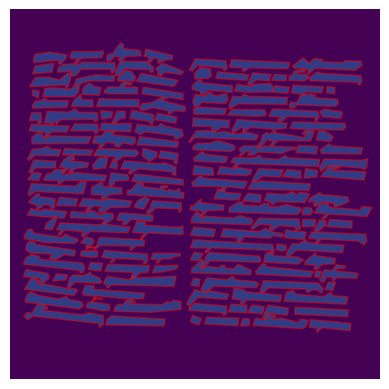

 95%|█████████▌| 19/20 [00:19<00:00,  1.04it/s]

data[1].keys()=dict_keys(['binary', 'lines', 'border_mask', 'watershed', 'word_polygons', 'line_polygons'])
background_ratio(binary)=0.5658671061197916
background_ratio(lines)=0.9812655978732638



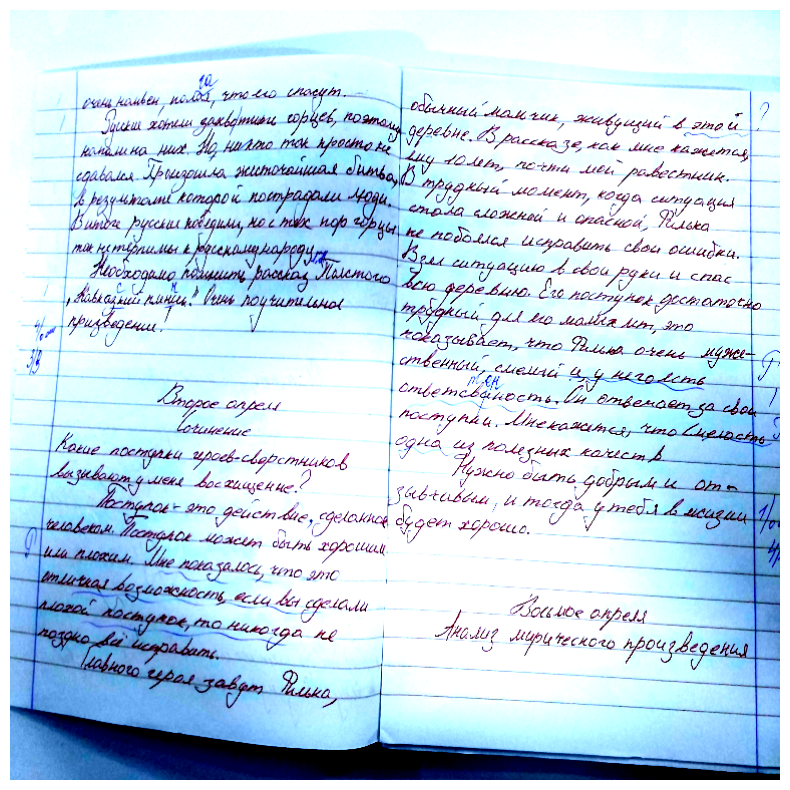

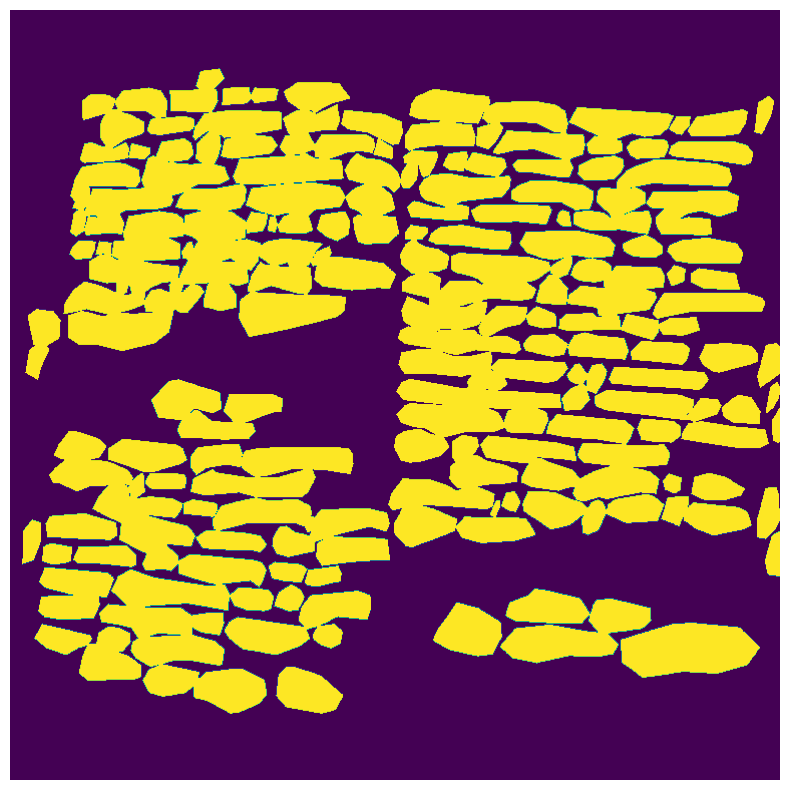

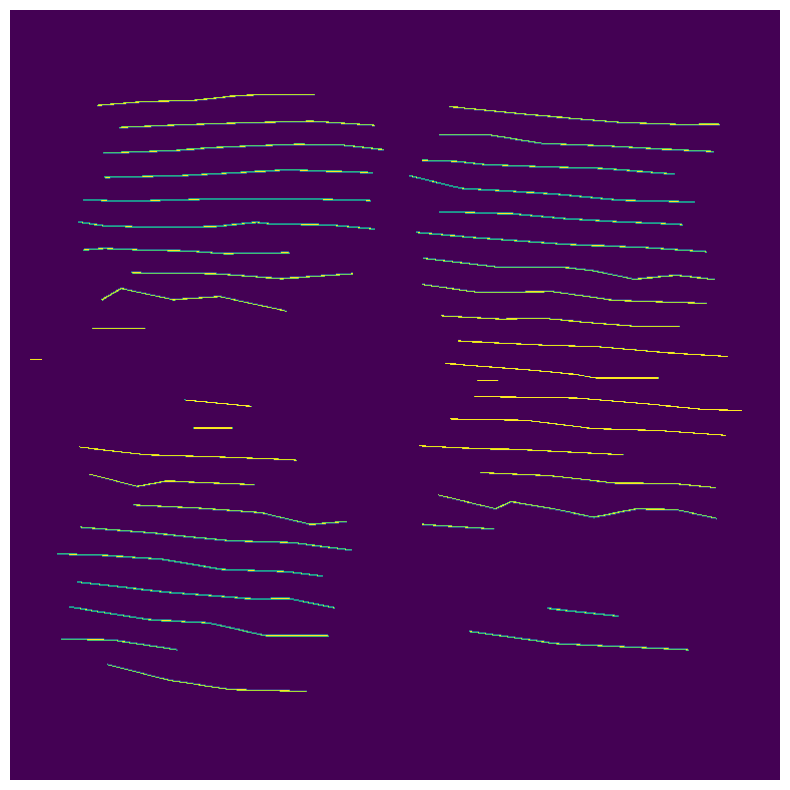

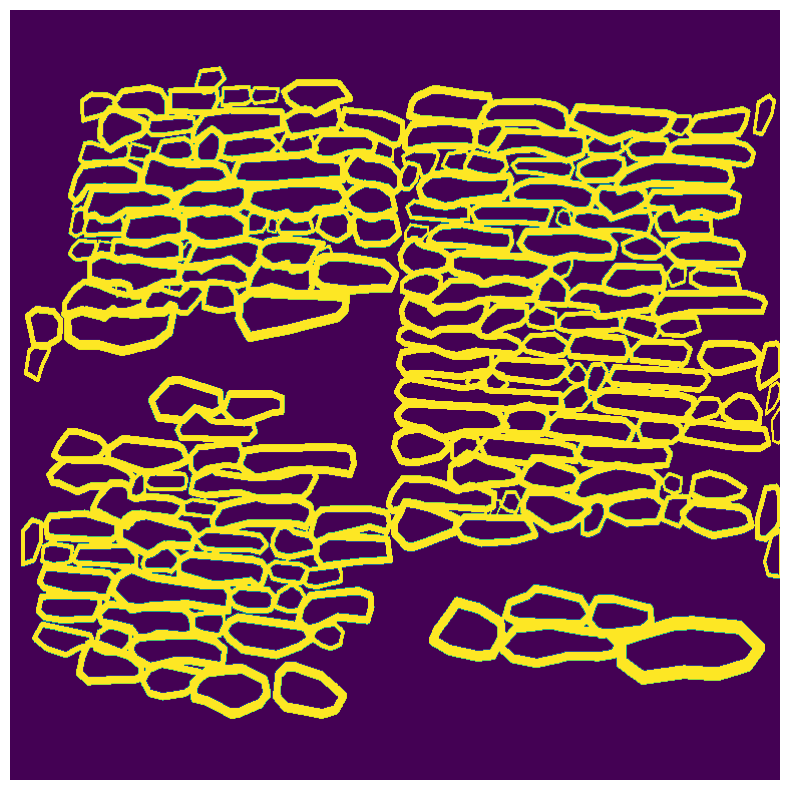

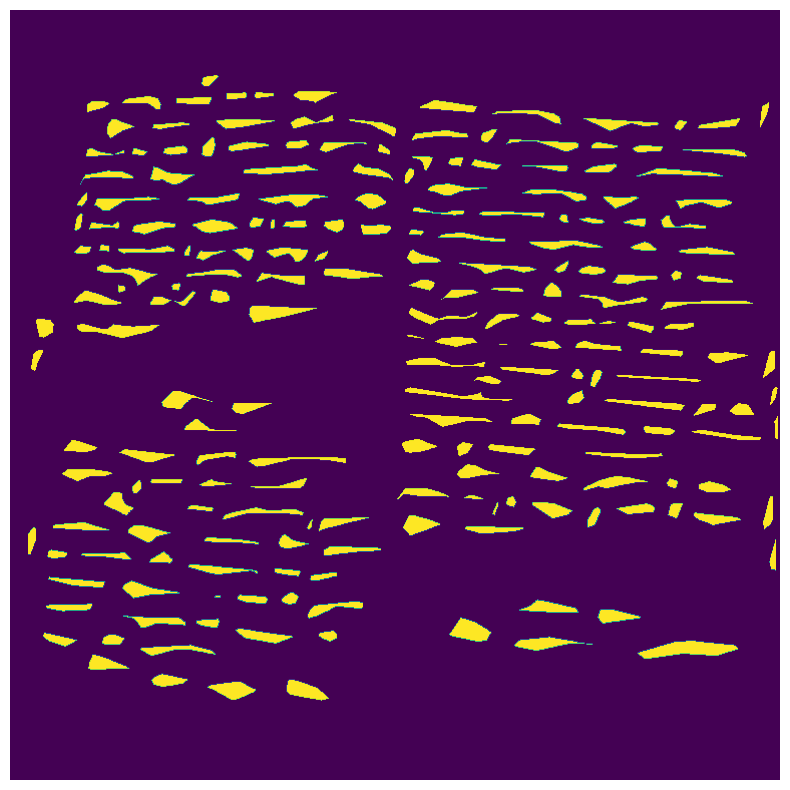

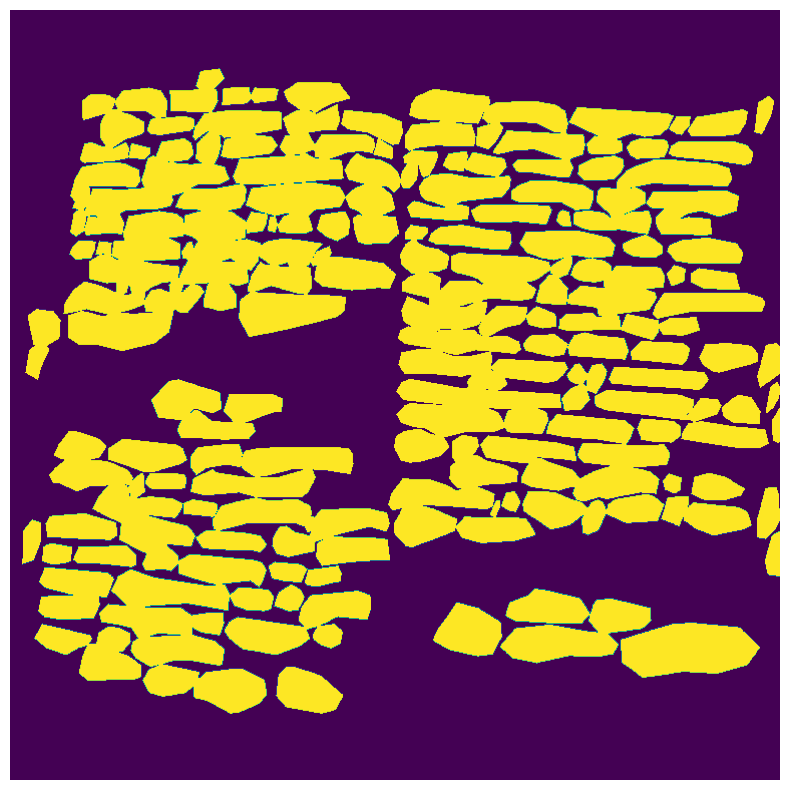

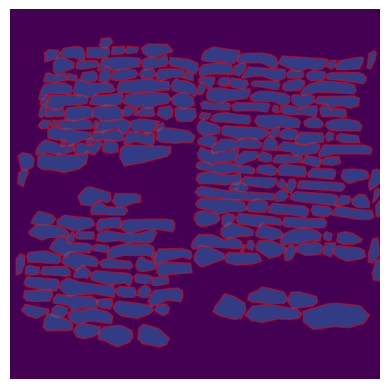

100%|██████████| 20/20 [00:22<00:00,  1.14s/it]

black_pixels_lines.avg=0.983533647325304
black_pixels_binary.avg=0.7473841349283854


In [36]:
from src.segmentation.metrics import AverageMeter
from src.segmentation.utils import visualize, background_ratio
from tqdm import tqdm

interval = 10
pos_to_show = 0

# black_pixels_thresh = AverageMeter('black_pixels_thresh)
black_pixels_binary = AverageMeter('black_pixels_binary')
black_pixels_lines = AverageMeter('black_pixels_lines')

for idx, data in tqdm(enumerate(validation_loader), total=len(validation_loader)):
    #     print(f"{data[0][pos_to_show].min()}-{data[0][pos_to_show].max()}")

    #     print(f"{data[0].shape=}")
    #     print(f"{data[0][0].shape=}")
    #     print(f"{data[0][0].min()}-{data[0][0].max()}")
    original = np.transpose(data[0][pos_to_show], (1, 2, 0))

    #     print(f"{type(data[1])=}")
    #     print(f"{data[1]['watershed_masks'].shape=}")
    #     print(f"{data[1]['binary'].shape=}")
    #     print(f"{data[1]['thresh'].shape=}")

    #     thresh = data[1]['thresh'][0].squeeze(0)
    #     instance = data[1]['instance'][0].squeeze(0)
    watershed_first = data[1]['watershed'][0][0]
    watershed_last = data[1]['watershed'][0][-1]

    binary = data[1]['binary'][pos_to_show].squeeze(0)
    lines = data[1]['lines'][pos_to_show].squeeze(0)
    borders = data[1]['border_mask'][pos_to_show].squeeze(0)
    word_polygons = data[1]['word_polygons'][pos_to_show]

    if idx % interval == (interval - 1):
        print(f"{data[1].keys()=}")

        #         print(f"{background_ratio(thresh)=}")
        print(f"{background_ratio(binary)=}")
        print(f"{background_ratio(lines)=}")
        print()

        visualize(original, 'original', cmap='gray')
        visualize(binary, 'binary')
        visualize(lines, 'lines')
        visualize(borders, 'borders')
        #         visualize(instance, 'instance')
        #         visualize(thresh, 'thresh')
        visualize(watershed_first, 'watershed_masks_0')
        visualize(watershed_last, 'watershed_masks_last')

        import numpy as np
        import matplotlib.pyplot as plt
        import matplotlib.patches as patches

        image = np.zeros((768, 768), dtype=np.uint8)

        fig, ax = plt.subplots()
        ax.imshow(image)

        for polygon in word_polygons:
            from shapely.geometry import Polygon

            if len(polygon) == 0: continue
            poly = patches.Polygon(polygon, closed=True, edgecolor='r', alpha=0.5)
            ax.add_patch(poly)

        plt.axis('off')
        plt.show()

    #     black_pixels_thresh.update(background_ratio(thresh))
    black_pixels_binary.update(background_ratio(binary))
    black_pixels_lines.update(background_ratio(lines))

# print(f"{black_pixels_thresh.avg=}")
print(f"{black_pixels_lines.avg=}")
print(f"{black_pixels_binary.avg=}")

In [ ]:
training_set_en.save_df()
training_set_ru.save_df()

In [ ]:
validation_set_en.save_df()
validation_set_ru.save_df()

# Download datasets

In [ ]:
!zip -r SchoolSegmentationDatasetEN-watershed.zip /kaggle/working/SchoolSegmentationDatasetEN > /dev/null

In [ ]:
!zip -r SchoolSegmentationDatasetRU-watershed.zip /kaggle/working/SchoolSegmentationDatasetRU > /dev/null

In [ ]:
from IPython.display import FileLink

FileLink(r'SchoolSegmentationDatasetEN-watershed.zip')

In [ ]:
from IPython.display import FileLink

FileLink(r'SchoolSegmentationDatasetRU-watershed.zip')

images.shape=torch.Size([4, 3, 768, 768])
targets.shape=torch.Size([4, 1, 768, 768])
torch.Size([3, 772, 3082])


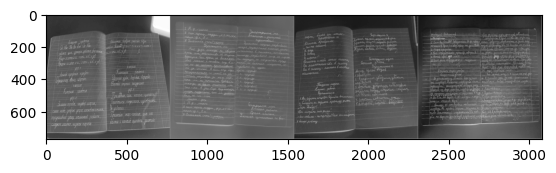

torch.Size([3, 772, 3082])


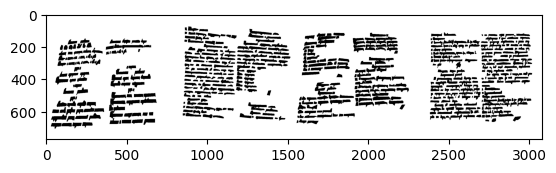

In [37]:
import matplotlib.pyplot as plt
import numpy as np


# Helper function for inline image display
def matplotlib_imshow(img, one_channel=False):
    print(f"{img.shape}")

    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


dataiter = iter(training_loader)
images, targets = next(dataiter)

targets = targets['binary']

print(f"{images.shape=}")
print(f"{targets.shape=}")

images = images.float()
targets = targets.float()

# Create a grid from the images and show them
img_grid = torchvision.utils.make_grid(images)
matplotlib_imshow(img_grid, one_channel=True)

target_grid = torchvision.utils.make_grid(targets)
matplotlib_imshow(target_grid, one_channel=True)

# Model 

In [38]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [47]:
from src.segmentation.losses import DiceFocalLoss

loss_fn = DiceFocalLoss()

In [ ]:
from src.segmentation.models import LinkResNet

model = LinkResNet(input_channels=3, output_channels=13, pretrained=False).to(device)

In [68]:
pretrained_model = LinkResNet(input_channels=3, output_channels=13, pretrained=False).to(device)
path = '/kaggle/input/backup-experiment-quarter-watershed-focal2-dice/model_2024-05-03_19-15-32_last'
pretrained_model.load_state_dict(torch.load(path, map_location=device))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


<All keys matched successfully>

In [69]:
# Optimizers specified in the torch.optim package
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-5)

x.shape=(10, 10)
c.shape=(10, 10, 3)


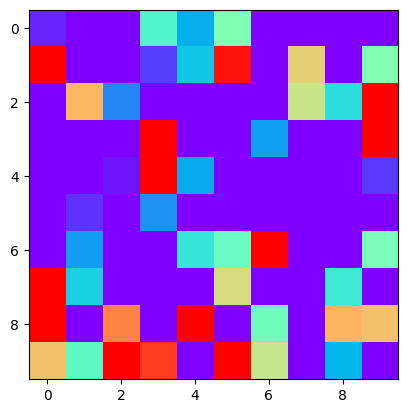

In [3]:
from src.segmentation.utils import colorize
import numpy as np
import matplotlib.pyplot as plt

x = np.random.randn(10, 10).clip(0, 1)
print(f"{x.shape=}")

c = colorize(x)
print(f"{c.shape=}")
plt.imshow(c)
plt.show()

In [72]:
from tqdm import tqdm
from src.segmentation.utils import dict_to

# PyTorch TensorBoard support
from torch.utils.tensorboard import SummaryWriter


def train_one_epoch(epoch_index, tb_writer):
    running_loss = 0.
    last_loss = 0.

    # Here, we use enumerate(training_loader) instead of
    # iter(training_loader) so that we can track the batch
    # index and do some intra-epoch reporting
    for idx, data in tqdm(enumerate(training_loader), total=len(training_loader)):
        # Every data instance is an input + label pair
        inputs, labels = data[0].to(device), dict_to(data[1], device)

        # Zero your gradients for every batch!
        optimizer.zero_grad()

        inputs = inputs.float()
        # Make predictions for this batch
        outputs = model(inputs)

        #         visualize(np.transpose(inputs[0].data.cpu().numpy(), (1, 2, 0)))
        #         visualize(colorize(outputs['binary'][0][0].data.cpu().numpy()))

        # Tensor Board Logging
        #         tb_writer.add_image(
        #             'Train/input',
        #             np.transpose(inputs[0].data.cpu().numpy(), (1, 2, 0)),
        #             i, 
        #             dataformats='HWC')
        #         tb_writer.add_image(
        #             'Train/binary_mask',
        #             colorize(outputs['binary'][0][0].data.cpu().numpy()),
        #             i, 
        #             dataformats='HWC')
        #         tb_writer.add_image(
        #             'Train/thresh_mask',
        #             colorize(outputs['thresh'][0][0].data.cpu().numpy()),
        #             i,
        #             dataformats='HWC')
        #         tb_writer.add_image(
        #             'Train/thresh_binary_mask',
        #             colorize(outputs['thresh_binary'][0][0].data.cpu().numpy()),
        #             i, 
        #             dataformats='HWC')
        #         tb_writer.add_image(
        #             'Train/energy',
        #             colorize(calculate_energy(outputs['watershed_masks'][0])[1]), 
        #             i,
        #             dataformats='HWC')

        #         visualize(colorize(calculate_energy(outputs['watershed_masks'][0])[1]))

        #         tb_writer.add_image(
        #             'Train/lines',
        #             colorize(outputs['lines'][0][0].data.cpu().numpy()),
        #             i,
        #             dataformats='HWC')

        #         visualize(colorize(outputs['lines'][0][0].data.cpu().numpy()))

        # Compute the loss and its gradients
        tb_x = epoch_index * len(training_loader) + idx + 1
        loss = loss_fn(outputs, labels, 'Train', tb_writer, tb_x)

        #         loss.requires_grad = True
        loss.backward()

        # Adjust learning weights
        optimizer.step()

        # Gather data and report
        running_loss += loss.item()

        track_loss_batch_size = 50
        if idx % track_loss_batch_size == (track_loss_batch_size - 1):
            last_loss = running_loss / track_loss_batch_size  # loss per batch
            print('  batch {} loss: {}'.format(idx + 1, last_loss))
            tb_writer.add_scalar('Loss/train', last_loss, tb_x)
            running_loss = 0.

    return last_loss

In [73]:
!rm -rf '/kaggle/working/weights'

In [74]:
import os

os.makedirs('/kaggle/working/weights', exist_ok=True)

In [75]:
!ls -la /kaggle/working/weights

total 8
drwxr-xr-x 2 root root 4096 May  4 19:28 .
drwxr-xr-x 9 root root 4096 May  4 19:28 ..


In [76]:
!rm -rf /kaggle/working/runs

In [77]:
import pandas as pd

evaluation_metrics = pd.DataFrame(columns=['Epoch', 'Val/IOU', 'Val/F1', 'Val/Accuracy', 'Val/Precision', 'Val/Recall'])

In [58]:
!pip install imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25834 sha256=f711771f266deefb67c26b8e42a6764399960c877a357ca2525183a73bb84121
  Stored in directory: /root/.cache/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


In [61]:
from src.segmentation.metrics import batch_mean, accuracy, precision, recall, f1_score, iou_pytorch
import torch
import numpy as np

preds = [torch.tensor(np.array([[0, 1], [0, 0]]))]
targets = [torch.tensor(np.array([[0, 1], [1, 0]]))]

acc = batch_mean(preds, targets, accuracy)
p = batch_mean(preds, targets, precision)
r = batch_mean(preds, targets, recall)
f1 = batch_mean(preds, targets, f1_score)
iou = batch_mean(preds, targets, iou_pytorch)
print(f"{acc=} {p=} {r=} {f1=} {iou=}")

acc=0.75 p=0.9999998807907104 r=0.5 f1=0.666666567325592 iou=0.5


In [62]:
from src.segmentation.metrics import calc_mAPIoU

calc_mAPIoU(
    preds=[[
        [[2, 1], [2, 3], [4, 3], [4, 1]],
        [[2, 1], [2, 3], [4, 3], [4, 1]],
        [[1, 1], [1, 3], [2, 3], [2, 2], [3, 2], [3, 1]],
        [[1, 1], [1, 3], [3, 3], [3, 1]],
        [[1, 1], [1, 3], [3, 3], [3, 1]],
        [[1, 1], [1, 3], [3, 3], [3, 1]]
    ]],
    targets=[[
        [],
        [[1, 1], [1, 3], [3, 3], [3, 1]],
        [[0, 0], [0, 1], [1, 1], [1, 0]],
        [],
        [],
        [[8, 0], [8, 1], [9, 1], [9, 0]]
    ]],
    upscale_ratio=1.0)

(0.125, 0.16666666666666666, 0.3333333333333333, 0.2222221777777867)

In [79]:
timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
writer = SummaryWriter('runs/school_notebooks_trainer_{}'.format(timestamp))
epoch_number = 0
EPOCHS = 15
best_vloss = 1000000

In [ ]:
from src.segmentation.metrics import MetricMonitor
from src.segmentation.predictor import calculate_energy

metric_monitor = MetricMonitor()

for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch_number + 1))

    # Make sure gradient tracking is on, and do a pass over the data
    model.train(True)
    avg_loss = train_one_epoch(epoch_number, writer)

    running_vloss = 0.0

    running_iou = 0.0
    running_f1_score = 0.0
    running_acc = 0.0
    running_r = 0.0
    running_p = 0.0
    running_mAPIoU_05 = 0.0

    # Set the model to evaluation mode, disabling dropout and using population
    # statistics for batch normalization.
    model.eval()

    loader_len = len(validation_loader)
    # Disable gradient computation and reduce memory consumption.
    with torch.no_grad():
        for i, vdata in tqdm(enumerate(validation_loader), total=loader_len):
            vinputs, vlabels = vdata[0].to(device), dict_to(vdata[1], device)

            vinputs = vinputs.float()
            voutputs = model(vinputs)

            if i == 1:
                fig = plt.figure(figsize=(15, 60))
                ax1 = fig.add_subplot(1, 4, 1)
                ax1.set_title('border_mask')
                ax1.imshow(colorize(voutputs['border_mask'][0].data.cpu().numpy()[0]))
                ax2 = fig.add_subplot(1, 4, 2)
                ax2.set_title('binary')
                ax2.imshow(colorize(voutputs['binary'][0].data.cpu().numpy()[0]))
                ax3 = fig.add_subplot(1, 4, 3)
                ax3.set_title('lines')
                ax3.imshow(colorize(voutputs['lines'][0].data.cpu().numpy()[0]))
                ax4 = fig.add_subplot(1, 4, 4)
                ax4.set_title('watershed')
                ax4.imshow(colorize(calculate_energy(voutputs['watershed'][0])[1]))
                plt.show()

            vloss = loss_fn(voutputs, vlabels)

            running_vloss += vloss

            binary_iou = batch_mean(voutputs['binary'], vlabels['binary'], iou_pytorch)
            binary_f1_score = batch_mean(voutputs['binary'], vlabels['binary'], f1_score)
            binary_acc = batch_mean(voutputs['binary'], vlabels['binary'], accuracy)
            binary_p = batch_mean(voutputs['binary'], vlabels['binary'], precision)
            binary_r = batch_mean(voutputs['binary'], vlabels['binary'], recall)

            lines_iou = batch_mean(voutputs['lines'], vlabels['lines'], iou_pytorch)
            lines_f1_score = batch_mean(voutputs['lines'], vlabels['lines'], f1_score)
            lines_acc = batch_mean(voutputs['lines'], vlabels['lines'], accuracy)
            lines_p = batch_mean(voutputs['lines'], vlabels['lines'], precision)
            lines_r = batch_mean(voutputs['lines'], vlabels['lines'], recall)

            running_iou += (binary_iou + lines_iou) / 2
            running_f1_score += (binary_f1_score + lines_f1_score) / 2
            running_acc += (binary_acc + lines_acc) / 2
            running_r += (binary_r + lines_r) / 2
            running_p += (binary_p + lines_p) / 2

    running_vloss /= loader_len
    running_iou /= loader_len
    running_f1_score /= loader_len
    running_acc /= loader_len
    running_r /= loader_len
    running_p /= loader_len
    running_mAPIoU_05 /= loader_len

    avg_vloss = running_vloss / (i + 1)
    print('LOSS train {} valid {}'.format(avg_loss, avg_vloss))

    metric_monitor.update('IoU', running_iou)
    metric_monitor.update('Acc', running_acc)
    metric_monitor.update('Precision', running_p)
    metric_monitor.update('Recall', running_r)
    metric_monitor.update('F1', running_f1_score)

    print(f"\n{metric_monitor}")

    # Log the running loss averaged per batch
    # for both training and validation
    writer.add_scalars('Training vs. Validation Loss',
                       {'Training': avg_loss, 'Validation': avg_vloss},
                       epoch_number + 1)
    writer.flush()

    metrics = {
        'Epoch': epoch_number + 1,
        'Val/IOU': metric_monitor.get('IoU'),
        'Val/F1': metric_monitor.get('F1'),
        'Val/Accuracy': metric_monitor.get('Acc'),
        'Val/Precision': metric_monitor.get('Precision'),
        'Val/Recall': metric_monitor.get('Recall'),

    }
    evaluation_metrics = pd.concat(
        [evaluation_metrics, pd.DataFrame([metrics])],
        ignore_index=True)

    # Track best performance, and save the model's state
    if avg_vloss < best_vloss:
        best_vloss = avg_vloss
        model_path = '/kaggle/working/weights/model_{}_{}'.format(timestamp, epoch_number)
        torch.save(model.state_dict(), model_path)

    epoch_number += 1

In [ ]:
evaluation_metrics.head(3)

In [ ]:
name = 'backup-experiment-quarter-watershed-focal2-dice'
path = f'/kaggle/working/{name}'

In [ ]:
df_plot = evaluation_metrics.set_index('Epoch')
columns_to_divide = df_plot.columns[df_plot.columns != 'Epoch']
df_plot[columns_to_divide] = df_plot[columns_to_divide]
df_plot.plot(title=name)
# df_plot = df_plot.reset_index()

# Saving 

In [ ]:
!ls -la /kaggle/working/backup-experiment-quarter-watershed-focal2-dice

In [ ]:
import os

os.makedirs(path, exist_ok=True)

In [ ]:
evaluation_metrics.to_csv(f'{path}/evaluation_metrics.csv')

In [ ]:
print(f'{epoch_number=}')
print(f'{best_vloss.item()=}')
print(f'{validation_transform=}')
print(f'{train_transform=}')

In [ ]:
# Specify the file path where you want to create the file
file_path = f'{path}/parameters.txt'

# Content to write to the file as a multi-line string
content = """
epoch_number=15
best_vloss.item()=0.006925816067389946
validation_transform=Compose([
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  Resize(always_apply=False, p=1, height=768, width=768, interpolation=1),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={}, is_check_shapes=True)
train_transform=Compose([
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  Resize(always_apply=False, p=1, height=768, width=768, interpolation=1),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={}, is_check_shapes=True)

Bilateral + Z-score
"""

# Open the file in write mode ('w')
with open(file_path, 'w') as file:
    # Write the multi-line content to the file
    file.write(content)

In [ ]:
# !cp -r '/kaggle/working/weights/model_2024-04-20_12-44-01_13' '/kaggle/working/backup-experiment-quarter-without-bce'

source_dir = '/kaggle/working/runs/school_notebooks_trainer_2024-05-03_19-15-32'
destination_dir = f'{path}/school_notebooks_trainer_2024-05-03_19-15-32'

from distutils.dir_util import copy_tree

copy_tree(source_dir, destination_dir)

In [ ]:
# !cp -r '/kaggle/working/runs/school_notebooks_trainer_2024-04-20_12-44-01' '/kaggle/working/backup-experiment-clahe-2'
source_dir = '/kaggle/working/weights/model_2024-05-03_19-15-32_10'
destination_dir = f'{path}'

import shutil

shutil.copy2(source_dir, destination_dir)

In [ ]:
model_path = f'{path}/model_{timestamp}_last'
torch.save(model.state_dict(), model_path)

In [ ]:
import shutil

shutil.make_archive(path, 'zip', path)

In [ ]:
from IPython.display import FileLink

FileLink(f'{name}.zip')

In [83]:
testing_set_en = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_EN/annotations_test.json',
    '/kaggle/working/school_notebooks_EN/images',
    folder_name='SchoolSegmentationDatasetEN',
    transform=validation_transform,
    preprocessing=preprocessing,

    #     df_path='/kaggle/working/SchoolSegmentationDatasetEN/annotations_test/df_annotations_test.csv', 
    df_path=None,

    keep=True)

testing_set_ru = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_RU/annotations_test.json',
    '/kaggle/working/school_notebooks_RU/images',
    folder_name='SchoolSegmentationDatasetRU',
    transform=validation_transform,
    preprocessing=preprocessing,

    #     df_path='/kaggle/working/SchoolSegmentationDatasetRU/annotations_test/df_annotations_test.csv', 
    df_path=None,

    keep=True)

In [84]:
seed()

In [85]:
from torch.utils.data import ConcatDataset, Subset

testing_set = ConcatDataset([testing_set_en, testing_set_ru])
testing_subset_size = len(testing_set) // 2
testing_subset_indices = torch.randperm(len(testing_set))[:testing_subset_size]
testing_set = Subset(testing_set, testing_subset_indices)
testing_subset_indices[:10]

tensor([102,  24, 132,   7,  34,  85, 130, 120,  70,  82])

In [86]:
testing_loader = torch.utils.data.DataLoader(
    testing_set,
    batch_size=4,
    shuffle=False,
    collate_fn=dynamic_length_collate,
    worker_init_fn=seed_worker,
    generator=g)

  0%|          | 0/20 [00:00<?, ?it/s]

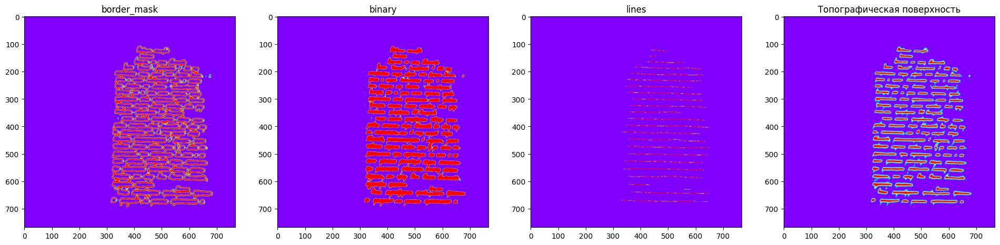

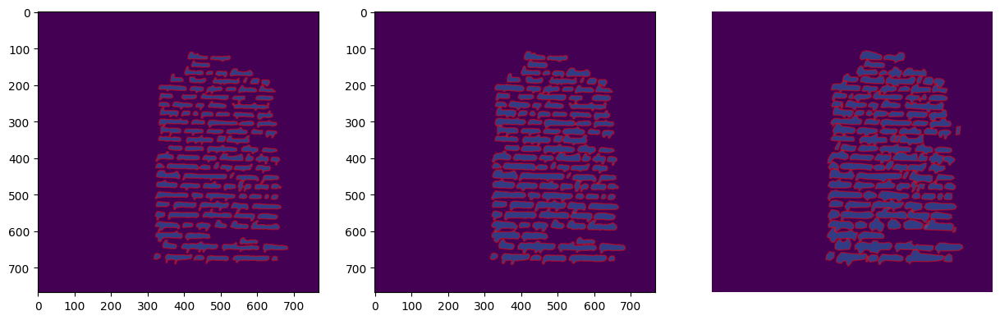

  5%|▌         | 1/20 [00:12<03:53, 12.29s/it]

meanIoU=0.786967297749527


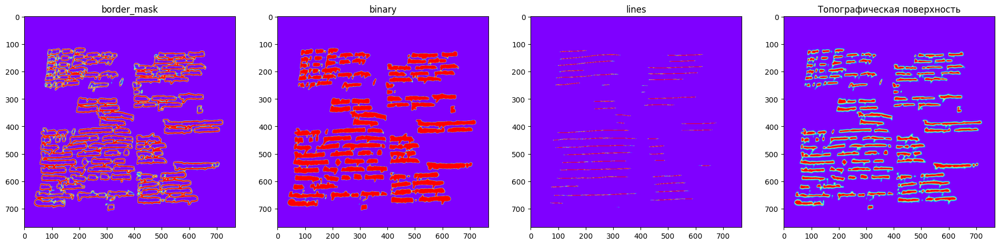

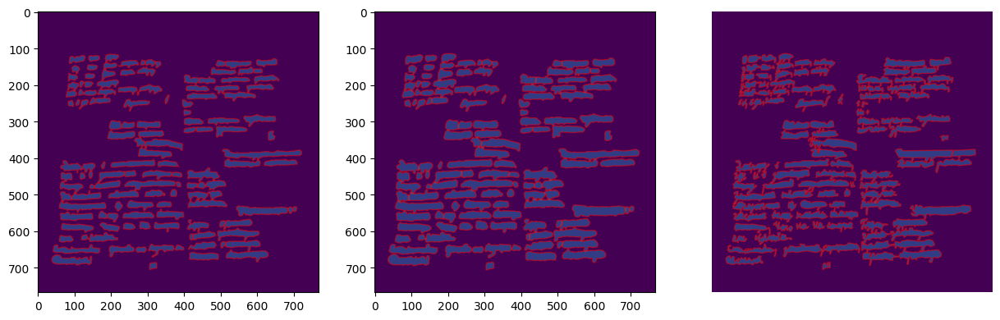

 10%|█         | 2/20 [00:44<07:12, 24.00s/it]

meanIoU=0.7113271049791566


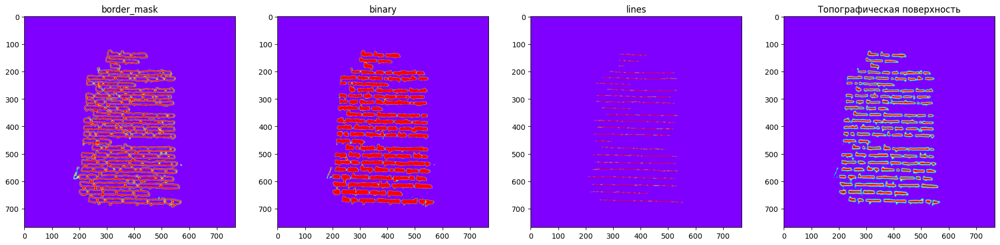

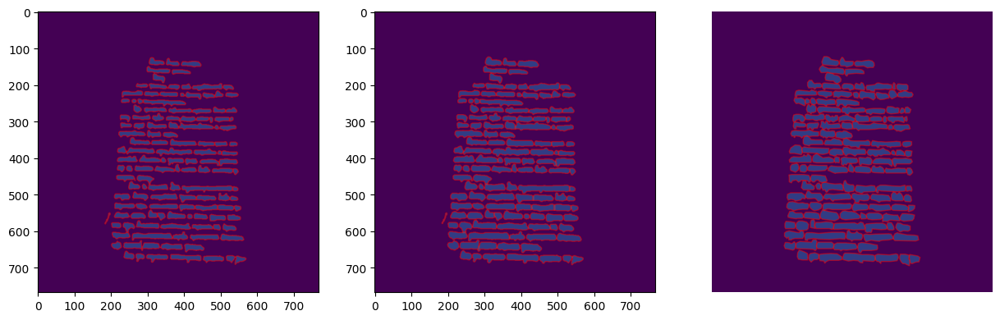

 15%|█▌        | 3/20 [00:57<05:21, 18.88s/it]

meanIoU=0.7567311909581647


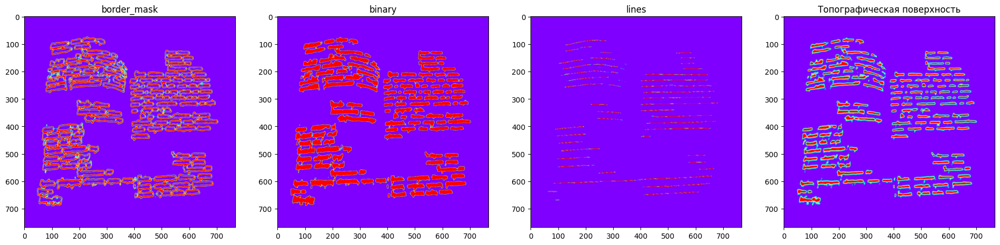

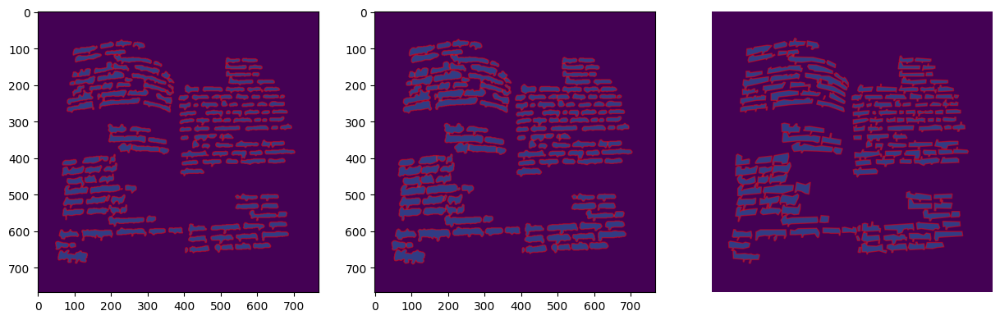

 20%|██        | 4/20 [01:09<04:22, 16.40s/it]

meanIoU=0.6923014734385007


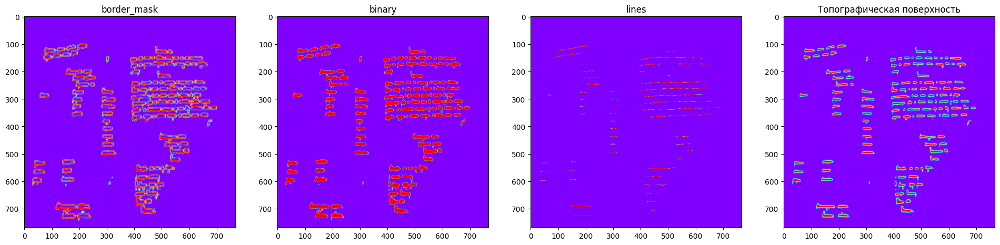

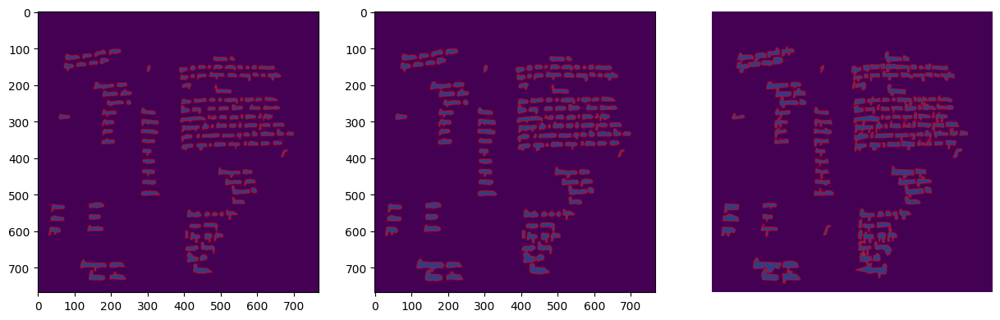

 25%|██▌       | 5/20 [01:25<03:59, 15.99s/it]

meanIoU=0.7998271968372863


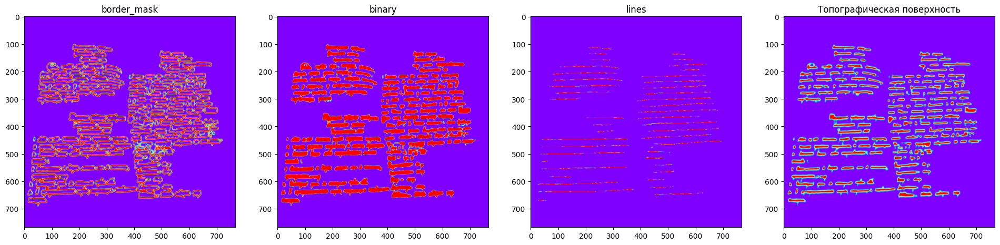

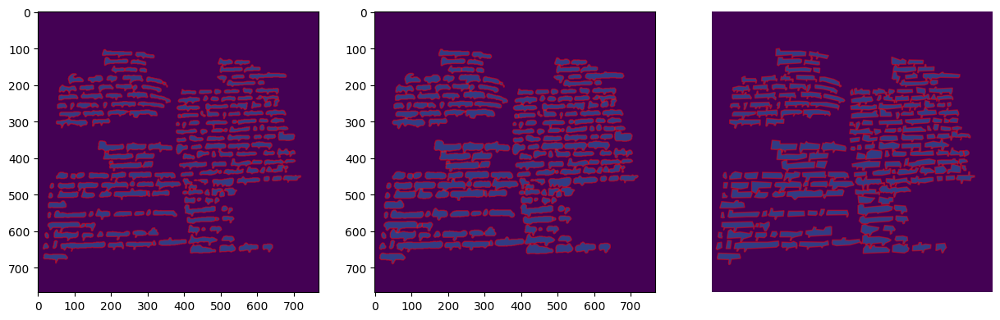

 30%|███       | 6/20 [01:48<04:17, 18.41s/it]

meanIoU=0.7268779377645538


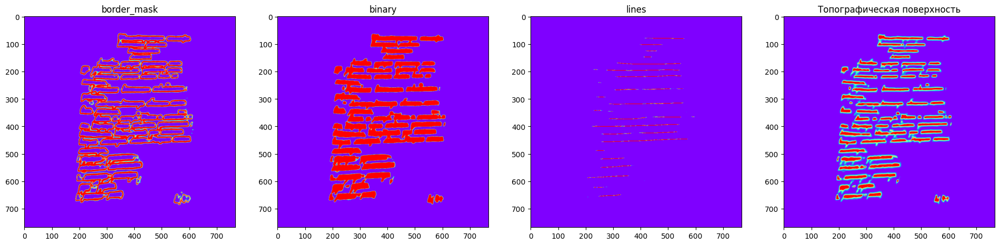

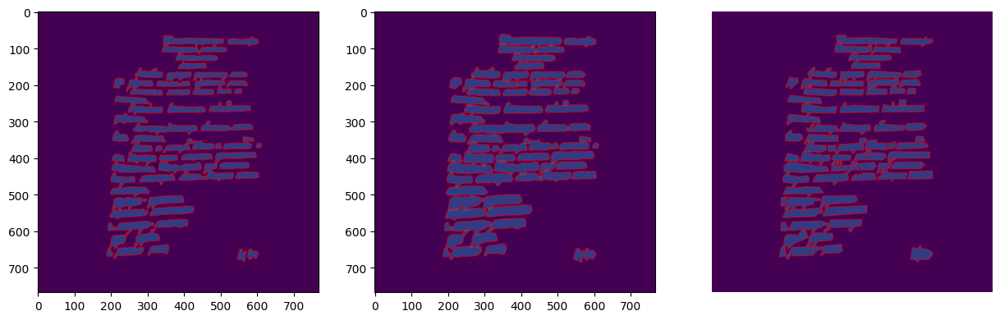

 35%|███▌      | 7/20 [02:04<03:48, 17.55s/it]

meanIoU=0.8082871564012244


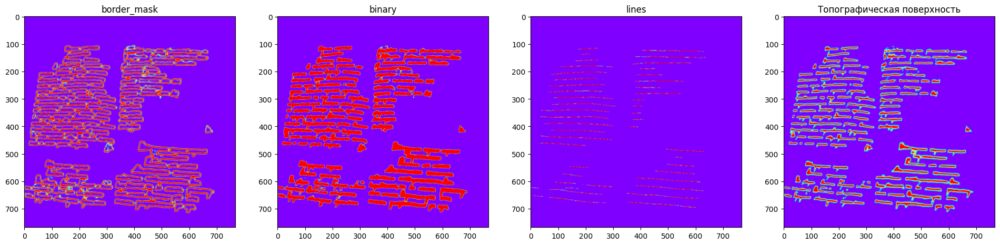

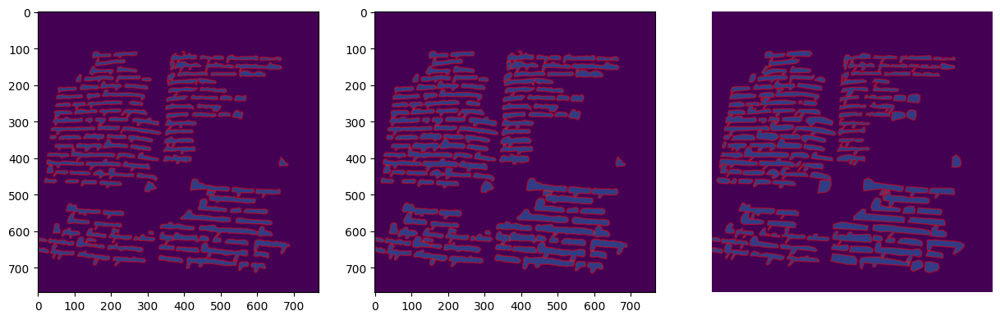

 40%|████      | 8/20 [02:24<03:42, 18.56s/it]

meanIoU=0.7922337027163933


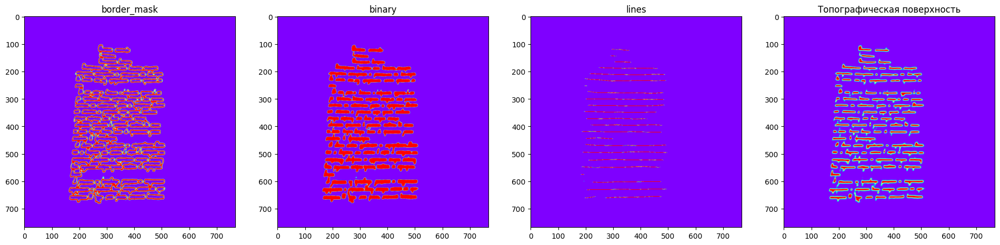

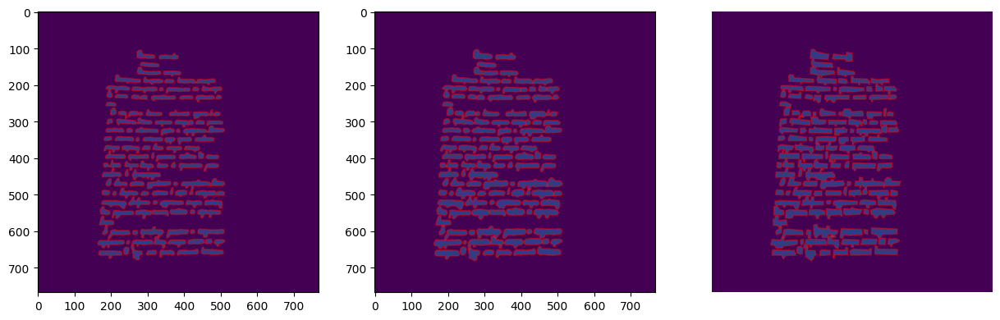

 45%|████▌     | 9/20 [02:40<03:14, 17.70s/it]

meanIoU=0.8200387385374921


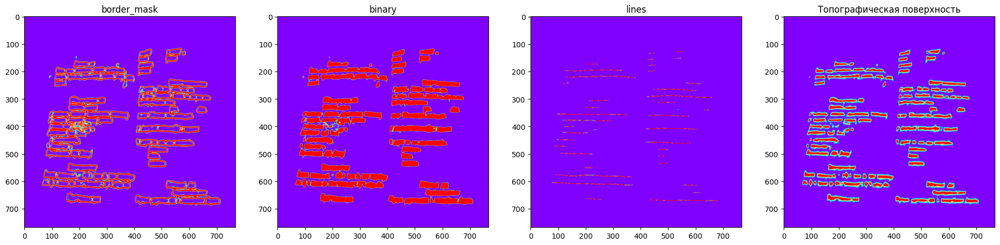

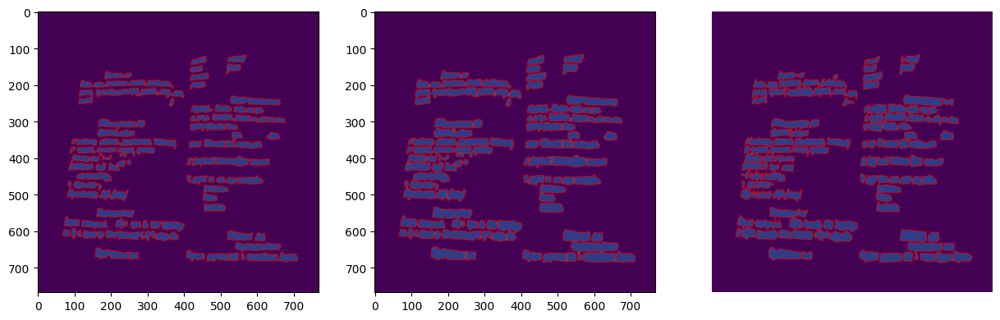

 50%|█████     | 10/20 [02:56<02:50, 17.06s/it]

meanIoU=0.6183636200640562


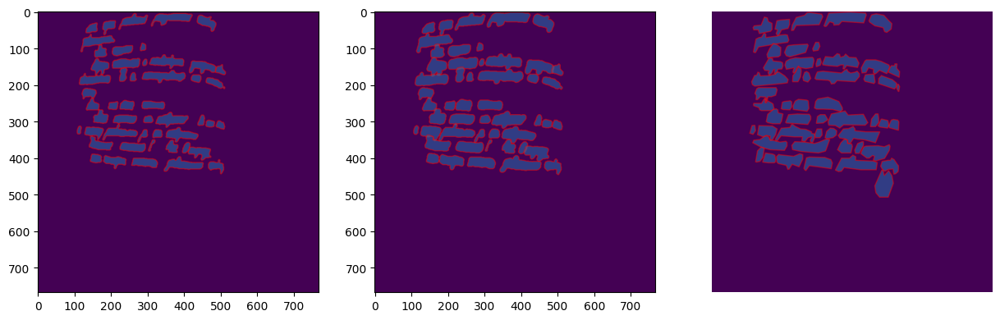

 55%|█████▌    | 11/20 [03:08<02:19, 15.50s/it]

meanIoU=0.7941650002609555


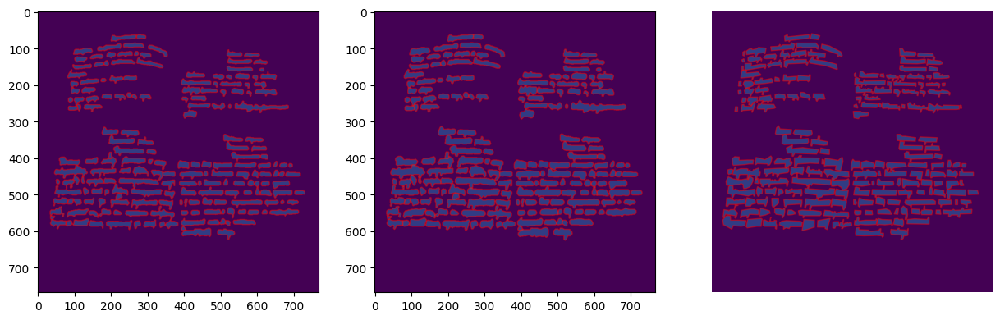

 60%|██████    | 12/20 [03:32<02:24, 18.10s/it]

meanIoU=0.7399090078622482


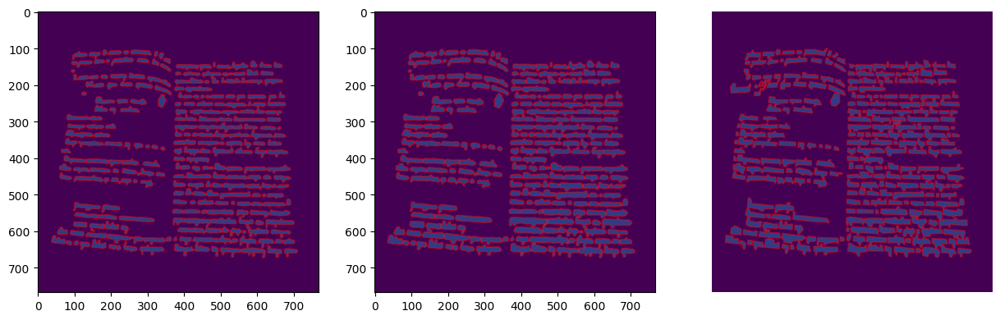

 65%|██████▌   | 13/20 [03:58<02:23, 20.56s/it]

meanIoU=0.7306267750253305


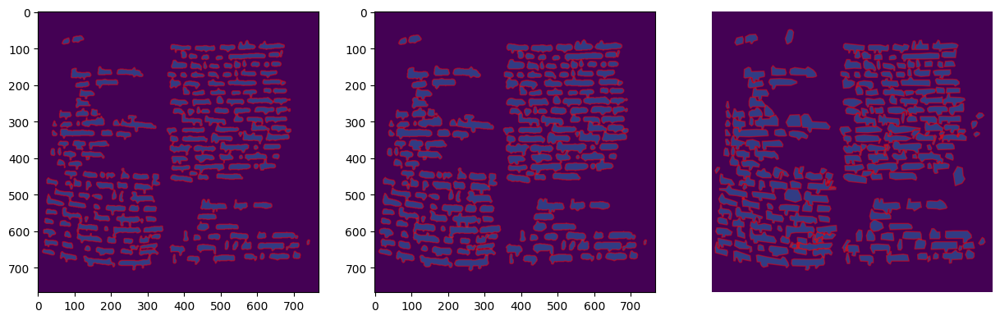

 70%|███████   | 14/20 [04:15<01:57, 19.66s/it]

meanIoU=0.5660406500651329


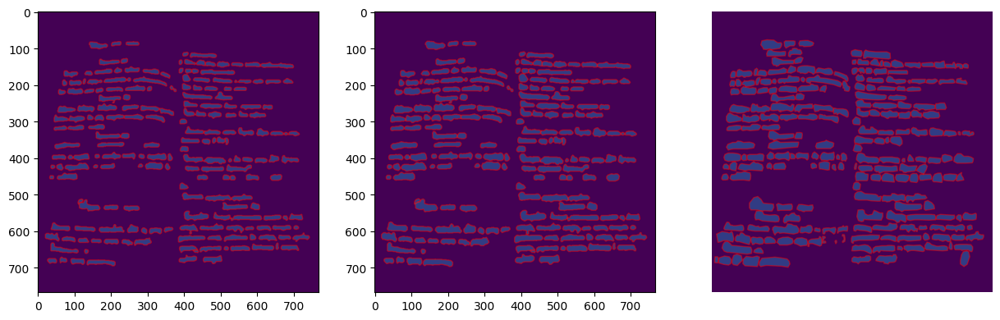

 75%|███████▌  | 15/20 [04:39<01:43, 20.72s/it]

meanIoU=0.7739517814528682


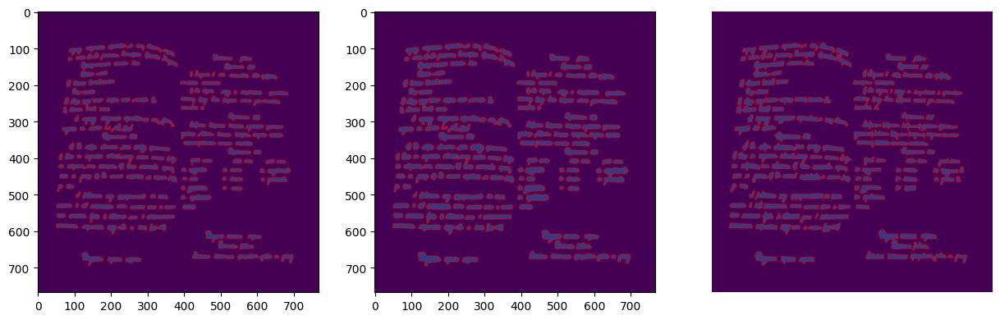

 80%|████████  | 16/20 [04:59<01:21, 20.46s/it]

meanIoU=0.7182169165158956


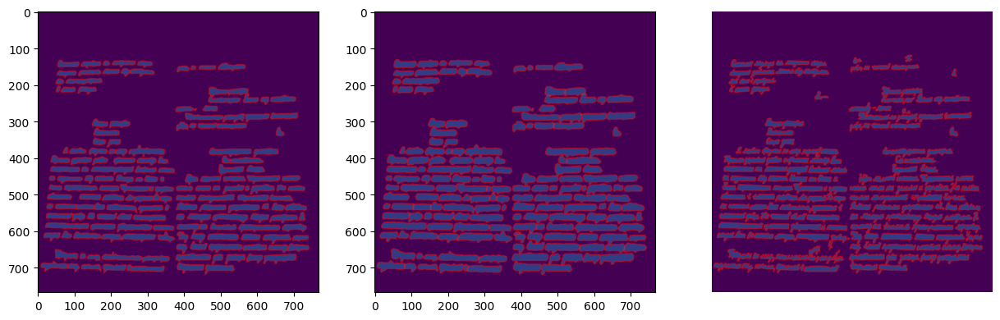

 85%|████████▌ | 17/20 [05:13<00:55, 18.56s/it]

meanIoU=0.7585535026091133


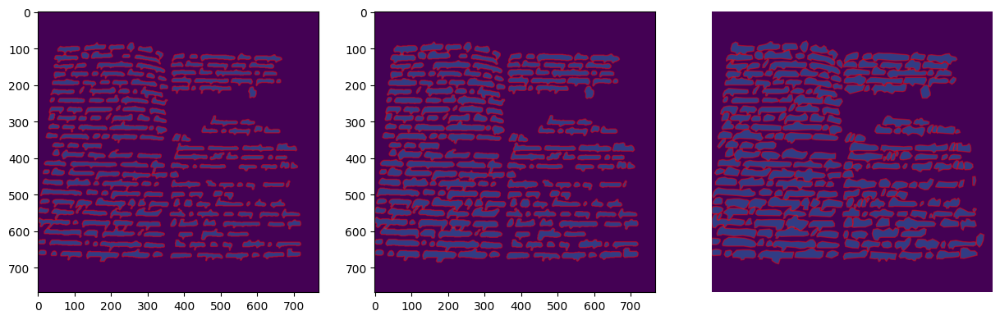

 90%|█████████ | 18/20 [05:29<00:35, 17.84s/it]

meanIoU=0.7491674258323802


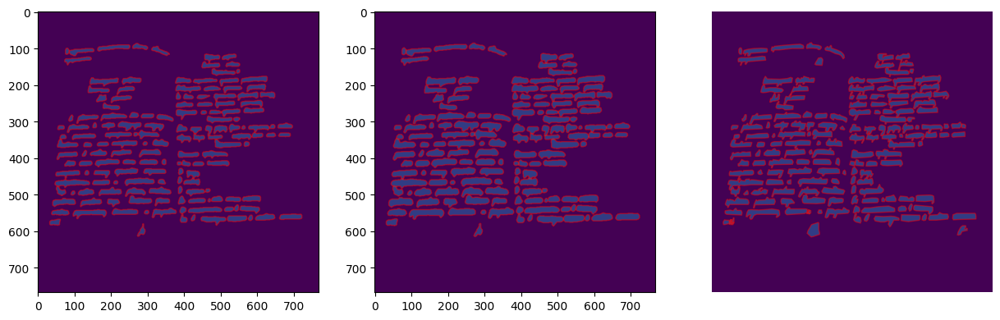

 95%|█████████▌| 19/20 [05:53<00:19, 19.85s/it]

meanIoU=0.8206313597820478


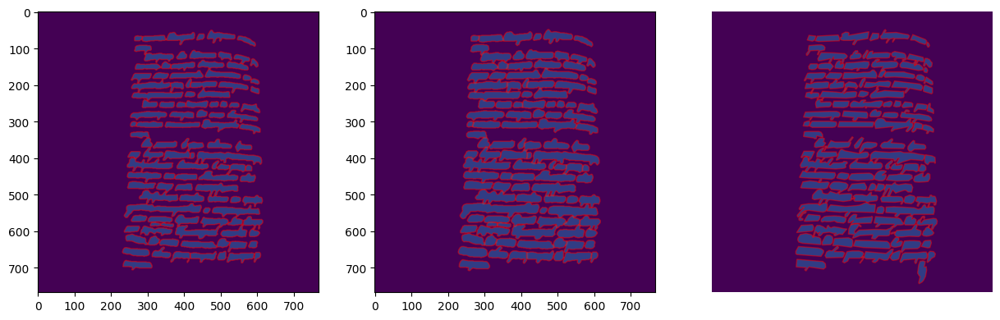

100%|██████████| 20/20 [06:08<00:00, 18.45s/it]

meanIoU=0.6759863646037646
LOSS test 0.008072193655341542

IoU: 0.572 | Acc: 0.970 | Precision: 0.681 | Recall: 0.750 | F1: 0.702 | mAP: 0.742 | polygonsPrecision: 0.855 | polygonsRecall: 0.840 | polygonsF1: 0.845


In [89]:
metric_mointor_test = MetricMonitor()

model.eval()

running_tloss = 0.0

running_tiou = 0.0
running_tf1_score = 0.0
running_tacc = 0.0
running_tr = 0.0
running_tp = 0.0

running_tmAPIoU_05 = 0.0
running_tpp = 0.0
running_tpr = 0.0
running_tpf1 = 0.0

# Disable gradient computation and reduce memory consumption.
loader_len = len(testing_loader)
with torch.no_grad():
    for i, vdata in tqdm(enumerate(testing_loader), total=loader_len):
        #         if i == 1: break

        vinputs, vlabels = vdata[0].to(device), dict_to(vdata[1], device)

        vinputs = vinputs.float()
        voutputs = model(vinputs)

        vloss = loss_fn(voutputs, vlabels)

        running_tloss += vloss

        if i < 10:
            fig = plt.figure(figsize=(30, 60))

            ax1 = fig.add_subplot(1, 5, 1)
            ax1.set_title('border_mask')
            ax1.imshow(colorize(voutputs['border_mask'][0].data.cpu().numpy()[0]))

            ax2 = fig.add_subplot(1, 5, 2)
            ax2.set_title('binary')
            ax2.imshow(colorize(voutputs['binary'][0].data.cpu().numpy()[0]))

            ax3 = fig.add_subplot(1, 5, 3)
            ax3.set_title('lines')
            ax3.imshow(colorize(voutputs['lines'][0].data.cpu().numpy()[0]))

            ax4 = fig.add_subplot(1, 5, 4)
            ax4.set_title('Топографическая поверхность')
            ax4.imshow(colorize(calculate_energy(
                voutputs['watershed'][0])[1]
                                ))

            #             original = np.transpose(vinputs[0].data.cpu().numpy(), (1, 2, 0))
            #             ax5 = fig.add_subplot(1,5,5)
            #             ax5.set_title('Исходное изображение')
            #             ax5.imshow(original)

            plt.show()

        #             result = voutputs['binary'][0].data.cpu().numpy()[0] - voutputs['border_mask'][0].data.cpu().numpy()[0]
        #             plt.imshow(colorize(result))
        #             plt.show()

        #         voutputs['binary'] = voutputs['binary'] - voutputs['border_mask']

        binary_tiou = batch_mean(voutputs['binary'], vlabels['binary'], iou_pytorch)
        binary_tf1_score = batch_mean(voutputs['binary'], vlabels['binary'], f1_score)
        binary_tacc = batch_mean(voutputs['binary'], vlabels['binary'], accuracy)
        binary_tp = batch_mean(voutputs['binary'], vlabels['binary'], precision)
        binary_tr = batch_mean(voutputs['binary'], vlabels['binary'], recall)

        lines_tiou = batch_mean(voutputs['lines'], vlabels['lines'], iou_pytorch)
        lines_tf1_score = batch_mean(voutputs['lines'], vlabels['lines'], f1_score)
        lines_tacc = batch_mean(voutputs['lines'], vlabels['lines'], accuracy)
        lines_tp = batch_mean(voutputs['lines'], vlabels['lines'], precision)
        lines_tr = batch_mean(voutputs['lines'], vlabels['lines'], recall)

        running_tiou += (binary_tiou + lines_tiou) / 2
        running_tf1_score += (binary_tf1_score + lines_tf1_score) / 2
        running_tacc += (binary_tacc + lines_tacc) / 2
        running_tr += (binary_tr + lines_tr) / 2
        running_tp += (binary_tp + lines_tp) / 2

        pred_data = get_watershed_predictions(vinputs, voutputs)  # batch size list of predictions


        def get_polygons(batch_pred, class_name):
            return [pred['polygon']
                    for pred in batch_pred['predictions']
                    if pred['class_name'] == class_name]


        predicted_word_polygons = list(map(
            lambda batch_pred: get_polygons(batch_pred, 'handwritten_text'), pred_data))

        predicted_line_polygons = list(map(
            lambda batch_pred: get_polygons(batch_pred, 'lines'), pred_data))

        import numpy as np
        import matplotlib.pyplot as plt
        import matplotlib.patches as patches

        image = np.zeros((768, 768), dtype=np.uint8)

        fig = plt.figure(figsize=(15, 45))
        ax1 = fig.add_subplot(1, 3, 1)
        ax2 = fig.add_subplot(1, 3, 2)
        upscale_ratio = 1.2

        for polygon in predicted_word_polygons[0]:
            from shapely.geometry import Polygon

            if len(polygon) == 0: continue

            poly = patches.Polygon(polygon, closed=True, edgecolor='r', alpha=0.5)
            ax1.add_patch(poly)

            upscaled_polygon = upscale_contour(polygon, upscale_ratio)
            upscaled_poly = patches.Polygon(upscaled_polygon, closed=True, edgecolor='r', alpha=0.5)
            ax2.add_patch(upscaled_poly)

        ax1.imshow(image)
        ax2.imshow(image)

        ax3 = fig.add_subplot(1, 3, 3)
        for polygon in vlabels['word_polygons'][0]:
            from shapely.geometry import Polygon

            if len(polygon) == 0: continue
            poly = patches.Polygon(polygon, closed=True, edgecolor='r', alpha=0.5)
            ax3.add_patch(poly)
        ax3.imshow(image)

        plt.axis('off')
        plt.show()

        #         original = np.transpose(vinputs[0].cpu().numpy(), (1, 2, 0))
        #         plt.imshow((original * 255).astype(np.uint8))
        #         plt.show()

        meanIoU, meanP, meanR, meanf1 = calc_mAPIoU(
            predicted_word_polygons, vlabels['word_polygons'], upscale_ratio=upscale_ratio)

        print(f"{meanIoU=}")

        running_tmAPIoU_05 += meanIoU
        running_tpp += meanP
        running_tpr += meanR
        running_tpf1 += meanf1

running_tloss /= loader_len
running_tiou /= loader_len
running_tf1_score /= loader_len
running_tacc /= loader_len
running_tr /= loader_len
running_tp /= loader_len

running_tmAPIoU_05 /= loader_len
running_tpp /= loader_len
running_tpr /= loader_len
running_tpf1 /= loader_len

avg_tloss = running_tloss / (i + 1)
print('LOSS test {}'.format(avg_tloss))

metric_mointor_test.update('IoU', running_tiou)
metric_mointor_test.update('Acc', running_tacc)
metric_mointor_test.update('Precision', running_tp)
metric_mointor_test.update('Recall', running_tr)
metric_mointor_test.update('F1', running_tf1_score)
metric_mointor_test.update('mAP', running_tmAPIoU_05)

metric_mointor_test.update('polygonsPrecision', running_tpp)
metric_mointor_test.update('polygonsRecall', running_tpr)
metric_mointor_test.update('polygonsF1', running_tpf1)

print(f"\n{metric_mointor_test}")

In [ ]:
testing_set_en.save_df()
testing_set_ru.save_df()

# Logging

In [ ]:
!wget https://bin.equinox.io/c/bNyj1mQVY4c/ngrok-v3-stable-linux-amd64.tgz
!tar xvzf ngrok-v3-stable-linux-amd64.tgz
!./ngrok authtoken 2NBUsTahExidrnNKiX1F9mEcqfM_23YXKFajCBgcH6tSJHYks

In [ ]:
import os
import multiprocessing

pool = multiprocessing.Pool(processes=10)
results_of_processes = [pool.apply_async(os.system, args=(cmd,), callback=None)
                        for cmd in [
                            f"tensorboard --logdir ./runs/ --host 0.0.0.0 --port 6006 &",
                            "./ngrok http 6006 &"
                        ]]

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
"import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

In [ ]:
!pip install gdown > /dev/null

In [ ]:
!gdown 1kMQrwNcExStnw5uTS3Ww-Y-ib2KjNWDx

In [ ]:
!unzip /kaggle/working/model_weights.zip

In [ ]:
import torch

# PATH = "/kaggle/input/weights-border-model/kaggle/working/weights_border_model/model.pt"
# saved_model = UNet(n_class=11).to(device)
# saved_model.load_state_dict(torch.load(PATH, map_location=device))

model = torch.load('/kaggle/input/weights-linknet-8-lines-only-4-epoch/kaggle/working/weights/model.pth')

In [ ]:
testing_set = SchoolSegmentationDataset(
    '/kaggle/working/school_notebooks_RU/annotations_test.json',
    '/kaggle/working/school_notebooks_RU/images',
    transform=validation_transform,
    df_path='/kaggle/working/SchoolSegmentationDataset/annotations_test/df_annotations_test.csv',
    keep=True)

testing_loader = torch.utils.data.DataLoader(
    testing_set, batch_size=4, shuffle=False)

In [ ]:
testing_set.save_df()

In [ ]:
from collections import defaultdict


class MetricMonitor:
    def __init__(self, float_precision=3):
        self.float_precision = float_precision
        self.reset()

    def reset(self):
        self.metrics = defaultdict(lambda: {"val": 0, "count": 0, "avg": 0})

    def update(self, metric_name, val):
        metric = self.metrics[metric_name]

        metric["val"] += val
        metric["count"] += 1
        metric["avg"] = metric["val"] / metric["count"]

    def __str__(self):
        return " | ".join(
            [
                f"{metric_name}: {metric['avg']:.{self.float_precision}f}"
                for (metric_name, metric) in self.metrics.items()
            ]
        )

In [ ]:
metric_monitor = MetricMonitor()
model.eval()
stream = tqdm(testing_loader)
with torch.no_grad():
    for i, vdata in enumerate(stream):
        test_inputs, test_labels = vdata[0].to(device), dict_to(vdata[1], device)
        test_outputs = model(test_inputs)

        # calculate accuracy and IoU metric on test dataset
        # using test_labels [0, 1] and test_outputs (probs) (B, C, H, W)

        loss = loss_fn(test_outputs, test_labels)

        thresh = 0.5

        # TODO: make plot with 2 images
        if i == 0:
            for test_input in test_inputs:
                plt.imshow(np.transpose(test_input.data.cpu().numpy(), (1, 2, 0)))
                plt.show()

            for batch_masks in test_outputs['watershed_masks']:
                pred_mask, pred_energy = calculate_energy(batch_masks)

                plt.imshow(colorize(pred_energy))
                plt.show()

            visualize(colorize(test_outputs['lines'][0][0].data.cpu().numpy()))

        # set threshold which will be used in prediction
        f1 = calc_f1_score(test_outputs['watershed_masks'], test_labels['watershed_masks'], threshold=thresh)
        iou_watershed = calc_iou(test_outputs['watershed_masks'], test_labels['watershed_masks'], threshold=thresh)
        iou_lines = calc_iou(test_outputs['lines'], test_labels['lines'], threshold=thresh)

        metric_monitor.update("Loss", loss.item())
        metric_monitor.update("F1-score", f1)
        metric_monitor.update("IoU watershed", iou_watershed)
        metric_monitor.update("IoU lines", iou_lines)

        for i in range(test_outputs['watershed_masks'].shape[1]):
            class_iou = calc_iou(test_outputs['watershed_masks'][:, i], test_labels['watershed_masks'][:, i],
                                 threshold=thresh)
            metric_monitor.update(f"IoU-{i}", class_iou)

        stream.set_description(
            f"Validation. {thresh=} {metric_monitor}"
        )

In [ ]:
model_path = '/kaggle/working/weights/model_{}_{}'.format(timestamp, 'last')
torch.save(model.state_dict(), model_path)

In [ ]:
PATH = '/kaggle/working/weights/model.pth'
torch.save(model, PATH)

In [ ]:
!ls -la /kaggle/working/weights

In [ ]:
!zip -r '/kaggle/working/weights_linknet-8_lines-only_>10-epoch.zip' /kaggle/working/weights-result

In [ ]:
!cp /kaggle/working/model_weights.zip /kaggle/working/drive/MyDrive/data

In [ ]:
!cp -r '/kaggle/working/runs' /kaggle/working/weights

In [ ]:
from IPython.display import FileLink

FileLink(r'linknet-9.onnx')

In [ ]:
# Input to the model
x = torch.randn(4, 3, 512, 512, requires_grad=True).to(device)
torch_out = model(x)

# Export the model
torch.onnx.export(model,  # model being run
                  x,  # model input (or a tuple for multiple inputs)
                  "linknet-9.onnx",  # where to save the model (can be a file or file-like object)
                  export_params=True,  # store the trained parameter weights inside the model file
                  opset_version=10,  # the ONNX version to export the model to
                  do_constant_folding=True,  # whether to execute constant folding for optimization
                  input_names=['input'],  # the model's input names
                  output_names=['output'],  # the model's output names
                  dynamic_axes={'input': {0: 'batch_size'},  # variable length axes
                                'output': {0: 'batch_size'}})

In [ ]:
!mkdir '/kaggle/working/weights-result'

In [ ]:
!cp -r '/kaggle/working/runs/school_notebooks_trainer_2024-04-13_08-26-09' '/kaggle/working/weights-result'

In [ ]:
!pip install onnxruntime onnx

In [ ]:
import onnxruntime

ort_session = onnxruntime.InferenceSession("/kaggle/working/linknet-9.onnx")

In [ ]:
import torchvision
import os

outputs = []
image_names = os.listdir('/kaggle/working/school_notebooks_RU/images')
image = cv2.imread('/kaggle/working/school_notebooks_RU/images/' + image_names[11])
train_transform = A.Compose([
    A.Resize(width=512, height=512),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),
])
for image in [image]:
    transformed_image = train_transform(image=image)['image']
    transformed_image = torchvision.transforms.ToTensor()(transformed_image)
    transformed_image = transformed_image[None, :, :, :]

    output = ort_session.run(None, {'input': transformed_image.numpy()})

    plt.imshow(output[1][0][0])
    plt.show()